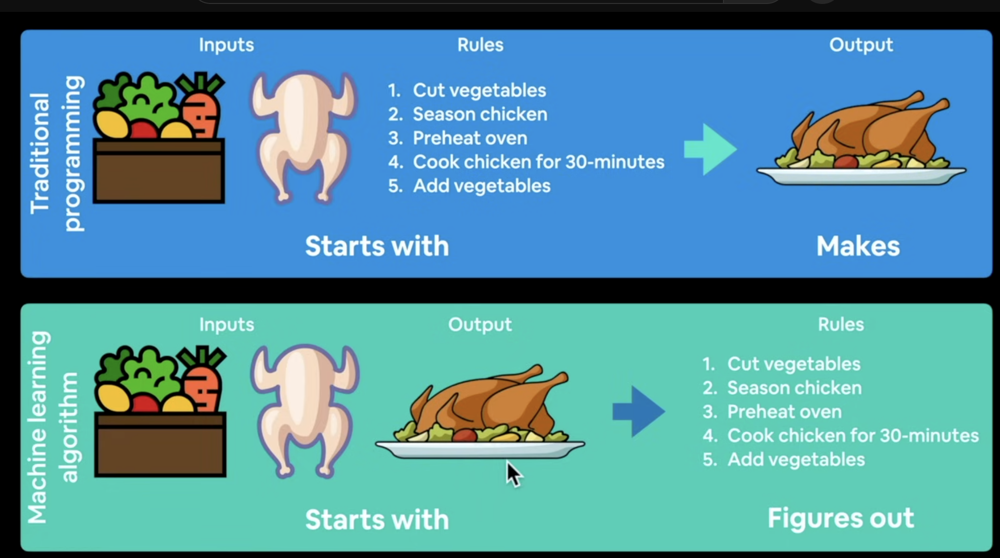

Great image! Let me break it down for you:

This picture is comparing **Traditional Programming** vs. **Machine Learning** using a cooking analogy.

---

### **Traditional Programming (Top part)**

* **Starts with:** Inputs (vegetables + chicken) and Rules (the recipe steps).
* **Process:** The programmer explicitly writes down the rules:

  1. Cut vegetables
  2. Season chicken
  3. Preheat oven
  4. Cook chicken for 30 minutes
  5. Add vegetables
* **Output:** The cooked dish.

👉 In traditional programming, you give the **inputs** and **rules** (code), and you get the **output**.

---

### **Machine Learning (Bottom part)**

* **Starts with:** Inputs (vegetables + chicken) **and the desired output** (the final cooked dish).
* **Process:** Instead of giving explicit rules, the system **figures out the rules** itself.
* **Output:** The algorithm learns steps like:

  1. Cut vegetables
  2. Season chicken
  3. Preheat oven
  4. Cook chicken for 30 minutes
  5. Add vegetables

👉 In machine learning, you give the **inputs** and the **outputs**, and the algorithm **learns the rules** on its own.

---

✅ **Key Difference:**

* Traditional programming = **Inputs + Rules → Output**
* Machine learning = **Inputs + Outputs → Rules**

Would you like me to also explain this using a real-world example, like spam email detection?


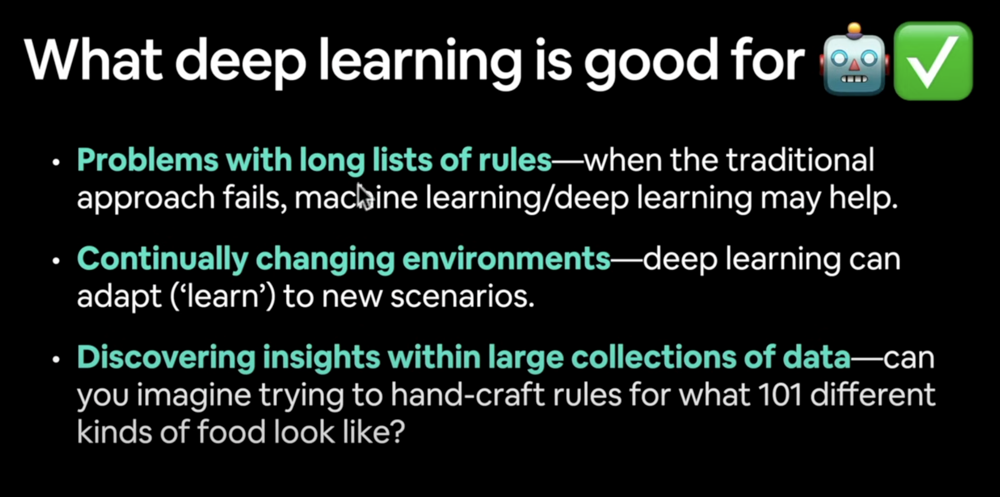

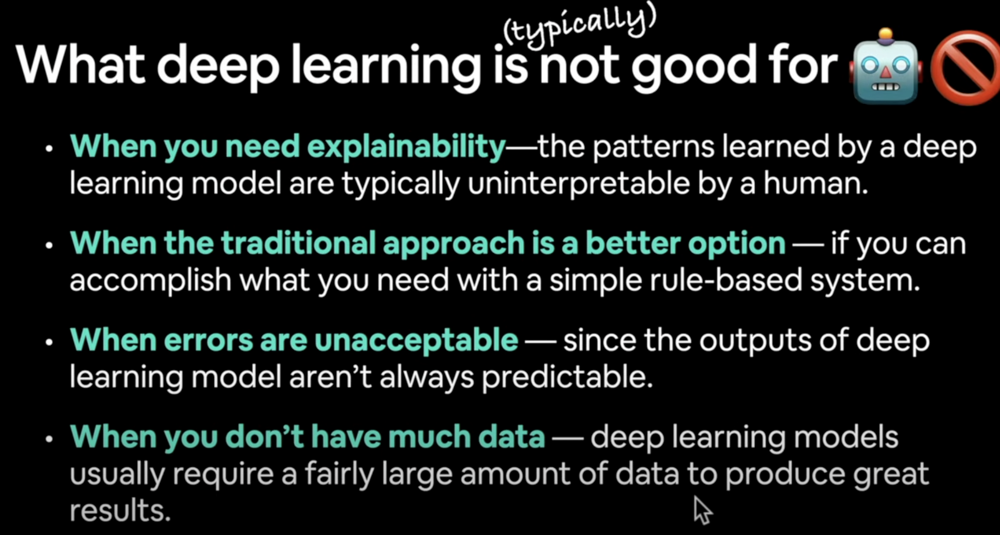

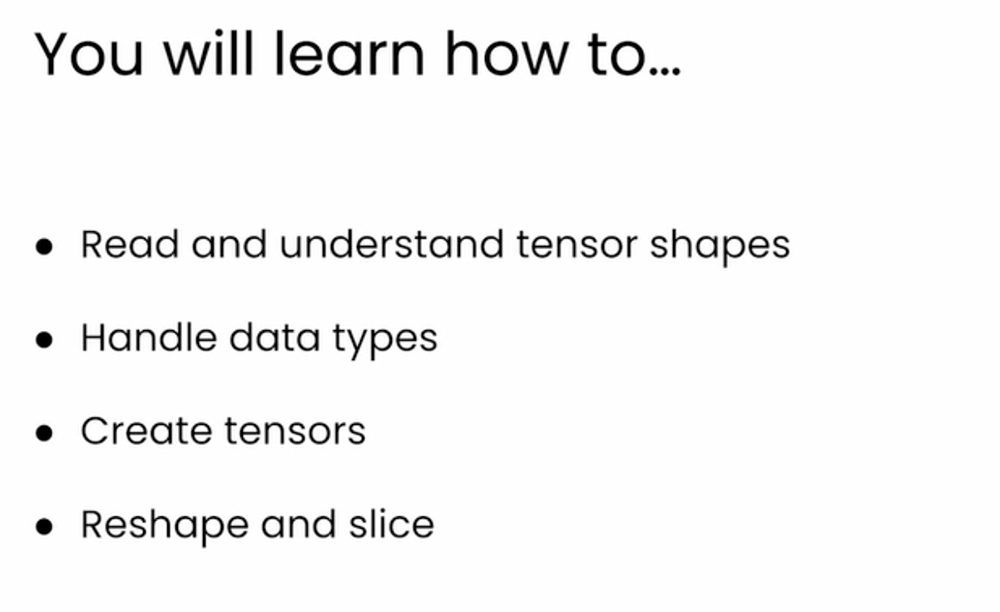

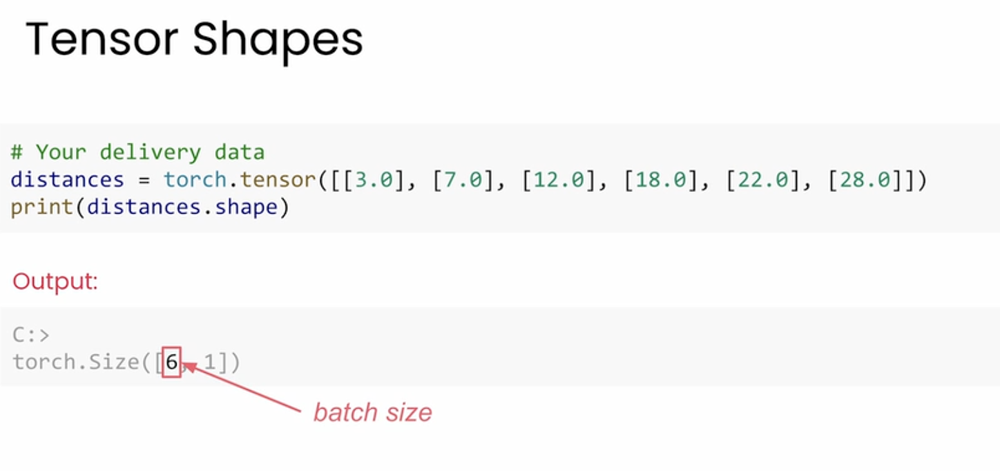

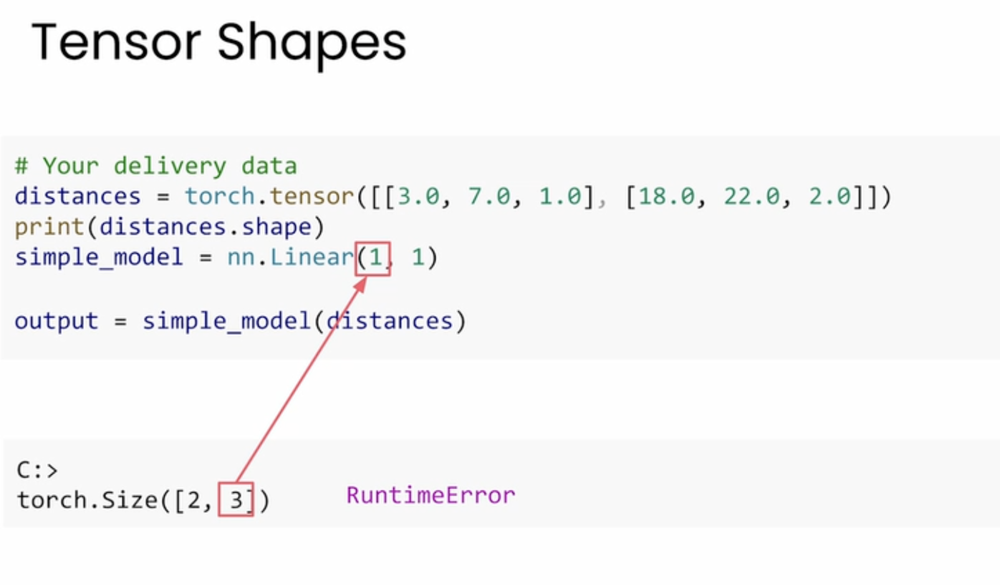

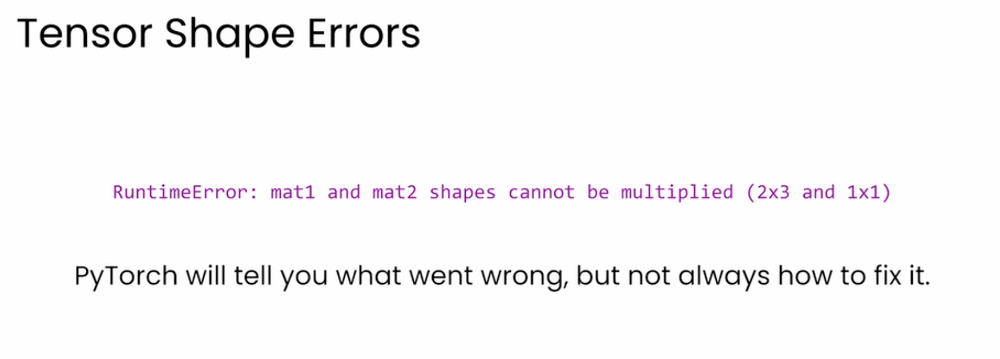

## Default datatypes

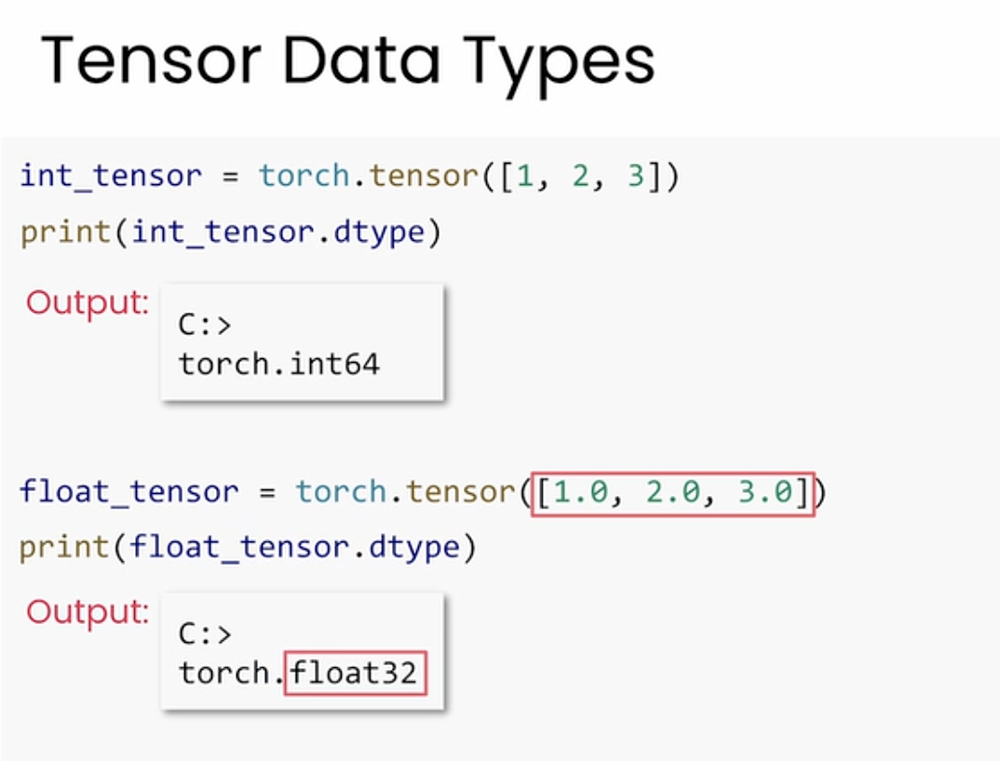

## Mixed types and automatic type conversion by Pytorch

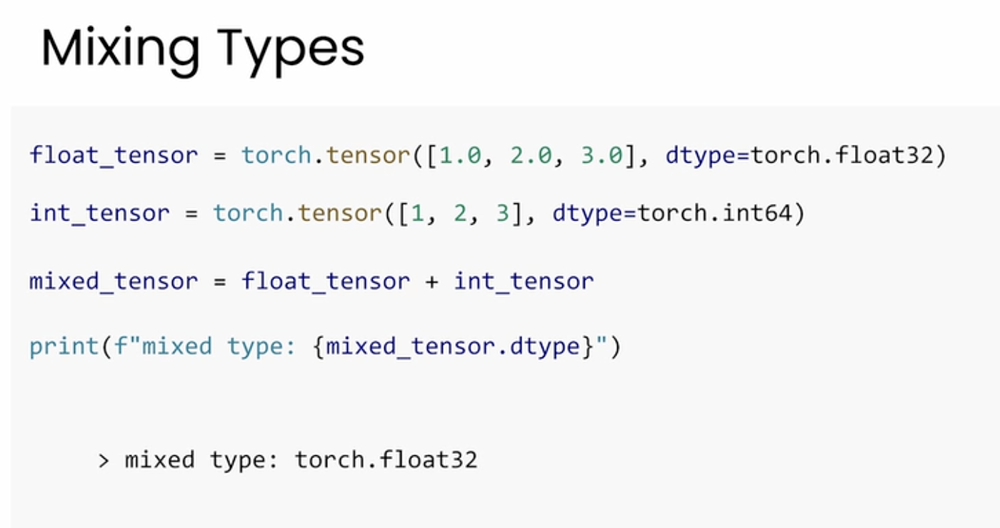

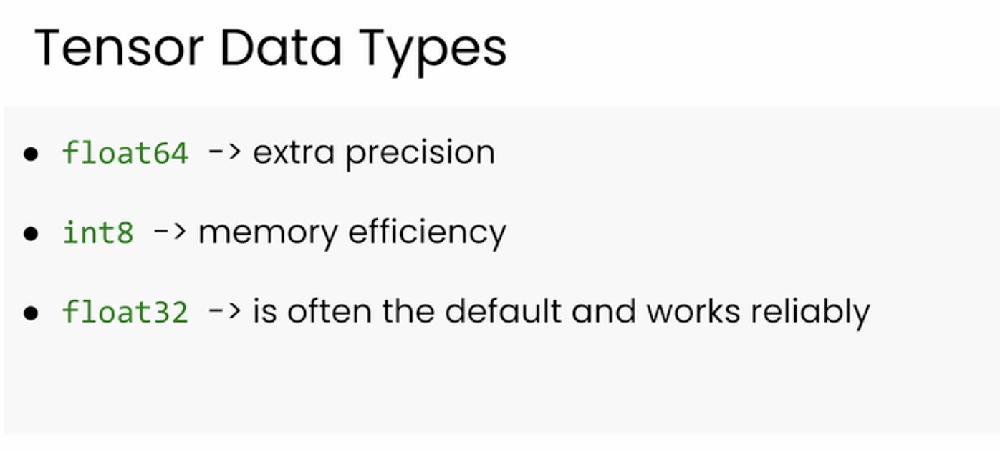

## Creating tensors

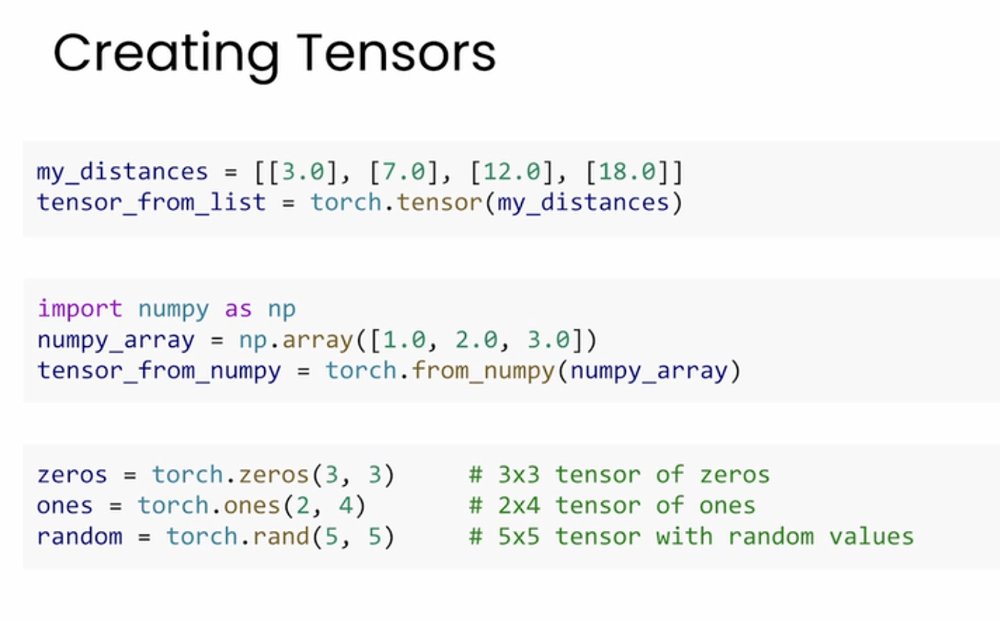

## if you want quick test data then go for below 

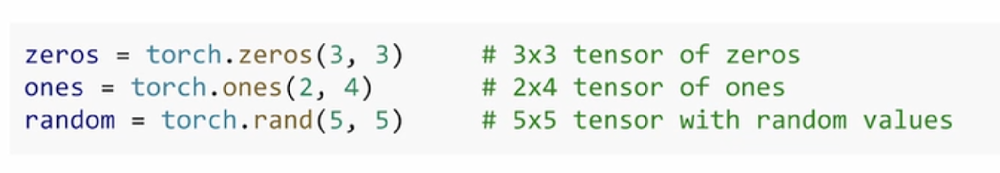

## How to solve tensor size errors?

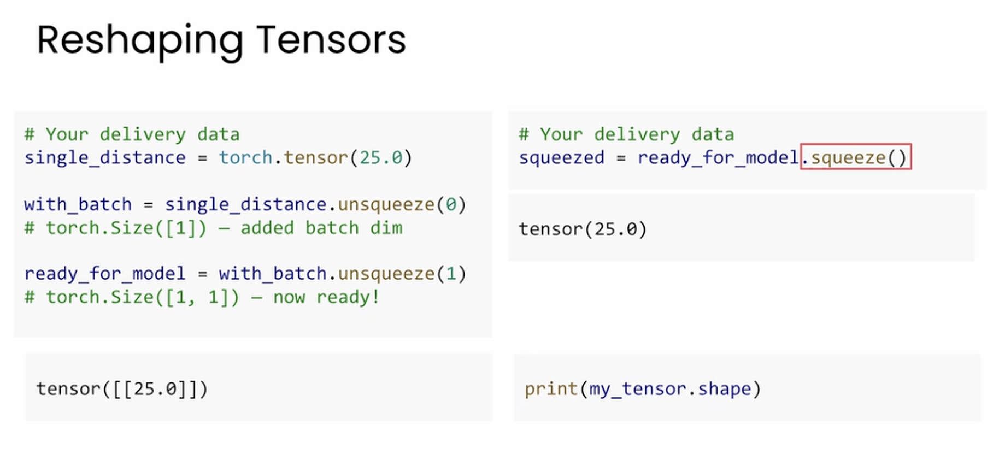

## Squeeze and unsqueeze

In PyTorch, **`unsqueeze`** and **`squeeze`** are used to **add or remove dimensions of size 1** from tensors.
They are *shape operations only* — **no data is copied or changed**.

Let’s go step by step with **clear intuition + examples**.

---

## 1. Why `unsqueeze` and `squeeze` exist

Many PyTorch operations expect tensors of **specific shapes**:

* Linear layers expect `(batch, features)`
* Conv layers expect `(batch, channels, height, width)`
* Loss functions expect matching dimensions

`unsqueeze` and `squeeze` help you **fix shape mismatches**.

---

## 2. `unsqueeze(dim)` — *add a dimension*

### What it does

Adds a **new dimension of size 1** at position `dim`.

```python
x = torch.tensor([1, 2, 3])
print(x.shape)        # torch.Size([3])

y = x.unsqueeze(0)
print(y.shape)        # torch.Size([1, 3])

z = x.unsqueeze(1)
print(z.shape)        # torch.Size([3, 1])
```

### Visualization

```
[3]        -> unsqueeze(0) -> [1, 3]
[3]        -> unsqueeze(1) -> [3, 1]
```

---

## 3. `squeeze(dim)` — *remove a dimension*

### What it does

Removes a dimension **only if its size is 1**.

```python
x = torch.tensor([[1, 2, 3]])
print(x.shape)        # [1, 3]

y = x.squeeze(0)
print(y.shape)        # [3]
```

⚠️ If the dimension size is not `1`, nothing happens.

```python
x = torch.randn(2, 3)
print(x.squeeze(0).shape)  # [2, 3] (unchanged)
```

---

## 4. `squeeze()` vs `squeeze(dim)`

### `squeeze()` (no argument)

Removes **all dimensions of size 1**.

```python
x = torch.randn(1, 3, 1, 5)
print(x.shape)        # [1, 3, 1, 5]

y = x.squeeze()
print(y.shape)        # [3, 5]
```

### `squeeze(dim)`

Removes **only that specific dimension**.

```python
x = torch.randn(1, 3, 1, 5)
print(x.squeeze(2).shape)  # [1, 3, 5]
```

---

## 5. Very common real-world examples

### Example 1: Batch dimension for a model

```python
x = torch.randn(10)     # features only
x = x.unsqueeze(0)     # add batch dimension

print(x.shape)         # [1, 10]
```

Needed because:

```python
nn.Linear(10, 5) expects (batch_size, features)
```

---

### Example 2: Loss function mismatch

```python
pred = torch.randn(32, 1)
target = torch.randn(32)

loss = nn.MSELoss()
```

❌ Error: shape mismatch

✅ Fix:

```python
pred = pred.squeeze(1)
loss(pred, target)
```

---

### Example 3: Channels for CNNs

```python
x = torch.randn(28, 28)        # grayscale image
x = x.unsqueeze(0).unsqueeze(0)

print(x.shape)                # [1, 1, 28, 28]
```

Format:

```
(batch, channels, height, width)
```

---

### Example 4: Removing batch dimension after inference

```python
x = torch.randn(1, 10)
output = model(x)

output = output.squeeze(0)
```

---

## 6. Negative dimensions

You can index dimensions from the end:

```python
x = torch.randn(3, 1)
x.unsqueeze(-1).shape   # [3, 1, 1]
x.squeeze(-1).shape     # [3, 1]
```

---

## 7. `unsqueeze` vs `view` vs `reshape`

| Operation   | Changes data? | Purpose                 |
| ----------- | ------------- | ----------------------- |
| `unsqueeze` | ❌ No          | Add dimension           |
| `squeeze`   | ❌ No          | Remove size-1 dimension |
| `view`      | ❌ No          | Reshape (contiguous)    |
| `reshape`   | ⚠️ Maybe      | Reshape safely          |

---

## 8. Key pitfalls ⚠️

### 1. Accidental batch removal

```python
x = torch.randn(1, 10)
x = x.squeeze()   # ❌ removes batch dimension
```

✅ Safer:

```python
x = x.squeeze(1)
```

---

### 2. Silent failures

```python
x.squeeze(0)  # does nothing if size != 1
```

Always check shapes.

---

## One-line intuition

> **`unsqueeze` adds a size-1 axis, `squeeze` removes it — nothing else changes.**

If you want, I can show:

* Shape debugging tricks
* Common interview questions
* How this affects broadcasting
* Visual diagrams of tensor shapes

Just tell me 👍


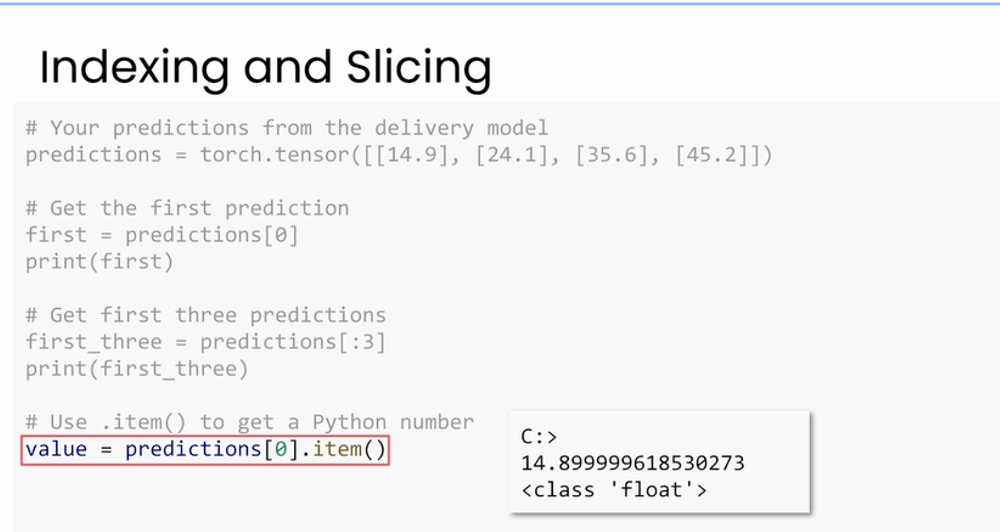

# Dynamic Computational Graphs in pytorch aka pytorch vs tensorflow

####  The main difference between those frameworks is - code notwithstanding - the way in which they create and run computations. In general, deep learning frameworks represent neural networks as computational graphs:


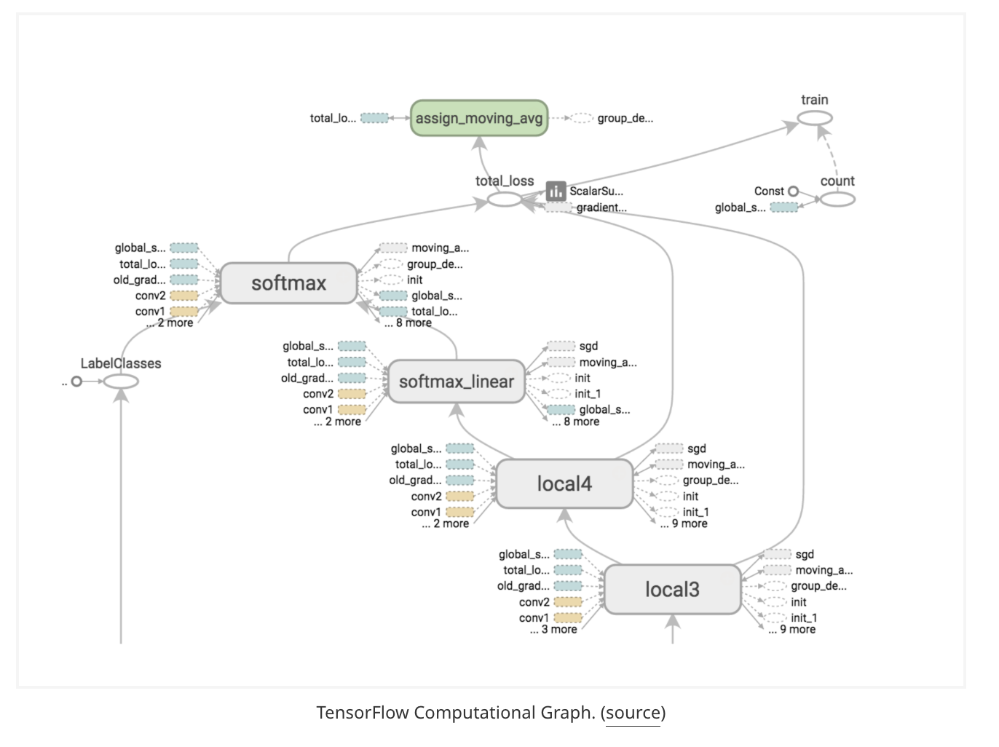

# what happens with and without dynamic graphs give me example with code

Great question — this is best understood with a **concrete side-by-side example**.

Below I’ll show **what happens WITH dynamic graphs (PyTorch)** vs **WITHOUT dynamic graphs (static graph style, like TensorFlow 1.x–style)** and why it matters.

---

## 1️⃣ WITH dynamic computational graphs (PyTorch)

The graph is **created at runtime for every forward pass**.

### Example: model behavior depends on input data

```python
import torch
import torch.nn as nn

class DynamicModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(10, 5)
        self.linear2 = nn.Linear(10, 5)

    def forward(self, x):
        # Data-dependent control flow
        if x.mean() > 0:
            return self.linear1(x)
        else:
            return self.linear2(x)

model = DynamicModel()

x1 = torch.randn(4, 10)   # mean could be positive
x2 = -torch.randn(4, 10)  # mean likely negative

y1 = model(x1)  # uses linear1
y2 = model(x2)  # uses linear2
```

### 🔍 What’s happening

* The computation graph is **built dynamically** each time `forward()` runs
* Different branches can be executed on different inputs
* Autograd tracks **only the operations that actually ran**
* This is **natural Python code**

---

## 2️⃣ WITHOUT dynamic graphs (static graph concept)

The graph must be **fully defined before execution**.

### Static-style example (conceptual TensorFlow 1.x)

```python
import tensorflow as tf

# Graph definition phase
x = tf.placeholder(tf.float32, shape=[None, 10])

linear1 = tf.layers.Dense(5)
linear2 = tf.layers.Dense(5)

mean = tf.reduce_mean(x)

# Control flow must be expressed symbolically
y = tf.cond(
    mean > 0,
    lambda: linear1(x),
    lambda: linear2(x)
)

# Execution phase
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())

    y1 = sess.run(y, feed_dict={x: x1_numpy})
    y2 = sess.run(y, feed_dict={x: x2_numpy})
```

### 🔍 What’s happening

* You **define the entire graph first**
* Control flow is **symbolic**, not Python `if`
* Debugging is harder (errors appear at runtime in session execution)
* The graph structure is fixed once built

---

## 3️⃣ Another clear example: variable-length loops

### ✅ PyTorch (dynamic)

```python
def dynamic_loop(x):
    result = x
    for i in range(x.shape[0]):  # runtime-dependent
        result = result * 2
    return result

x = torch.randn(5)
y = dynamic_loop(x)
```

### ❌ Static graph (not allowed directly)

```python
# This is NOT allowed in static graphs
for i in range(x.shape[0]):  # x.shape[0] unknown at graph build time
    ...
```

Instead, static frameworks require special ops like `tf.while_loop`.

---

## 4️⃣ Debugging difference

### PyTorch

```python
def forward(self, x):
    print(x.shape)     # works
    print(x.mean())    # works
    return self.layer(x)
```

### Static graph

```python
print(x.shape)  # prints a symbolic tensor, not real values
```

You must run a session just to inspect values.

---

## 5️⃣ Summary table

| Feature                 | Dynamic Graph (PyTorch) | Static Graph     |
| ----------------------- | ----------------------- | ---------------- |
| Graph creation          | At runtime              | Before execution |
| Python `if/for`         | ✅ Works naturally       | ❌ Not allowed    |
| Debugging               | Easy                    | Hard             |
| Variable-length inputs  | Easy                    | Complex          |
| Research & prototyping  | Excellent               | Poor             |
| Production optimization | Needs compilation       | Strong           |

---

## 6️⃣ Key takeaway

* **With dynamic graphs**: your model behaves like normal Python code
* **Without dynamic graphs**: you must think in graphs, placeholders, and symbolic ops

That’s why PyTorch is preferred for **research and rapid experimentation**, while static graphs historically favored **deployment optimization**.

If you want, I can also show **how PyTorch converts dynamic graphs into static ones** using `torch.compile` or TorchScript.


## What is autograd?

**Autograd (Automatic Differentiation)** is the system that **automatically computes gradients** for tensors in deep learning frameworks like **PyTorch** (and TensorFlow), which are needed to train neural networks using backpropagation.

---

## 🧠 What Autograd does (in simple terms)

Autograd:

1. **Records operations** performed on tensors during the forward pass
2. **Builds a computation graph** of those operations
3. **Applies the chain rule automatically** to compute gradients during the backward pass

You **don’t write gradient formulas by hand**.

---

## 🔍 Simple example (PyTorch)

```python
import torch

x = torch.tensor(2.0, requires_grad=True)
y = x ** 2 + 3 * x

y.backward()
print(x.grad)  # dy/dx = 2x + 3 → 7
```

### What happened?

* Autograd tracked `x ** 2` and `3 * x`
* When `backward()` was called, it computed derivatives automatically

---

## 🧩 How Autograd works internally (conceptual)

* Each tensor stores:

  * its value
  * a reference to the operation that created it (`grad_fn`)
* During `backward()`:

  * gradients flow **backward through the graph**
  * the chain rule is applied at each node

---

## 🔁 Autograd + Dynamic Graphs

In PyTorch:

* The computation graph is **built dynamically at runtime**
* After `backward()`, the graph is **freed**
* A new graph is built on the next forward pass

This makes debugging and experimentation easy.

---

## 🛠️ Example with a neural network

```python
import torch
import torch.nn as nn

model = nn.Linear(3, 1)
x = torch.randn(5, 3)
y_true = torch.randn(5, 1)

y_pred = model(x)
loss = ((y_pred - y_true) ** 2).mean()

loss.backward()

print(model.weight.grad)
print(model.bias.grad)
```

Autograd:

* Tracks all ops inside `model(x)`
* Computes gradients for **every parameter automatically**

---

## 🚦 Key Autograd features

* `requires_grad=True` → track gradients
* `.backward()` → compute gradients
* `.grad` → stores gradients
* `torch.no_grad()` → disable gradient tracking (inference)
* `detach()` → remove tensor from graph

---

## ⚠️ Important notes

* Gradients **accumulate** by default → call `optimizer.zero_grad()`
* Only tensors with `requires_grad=True` get gradients
* Autograd works with GPUs automatically

---

## ✅ In one sentence

**Autograd is PyTorch’s engine that builds a computation graph during execution and automatically computes gradients using backpropagation.**

If you want, I can also explain:

* how `requires_grad`, `detach`, and `no_grad` differ
* how autograd compares to symbolic differentiation
* how autograd works step-by-step with diagrams


# Give me an example of autograd buildng the computational graph with code

Below is a **clear, step-by-step PyTorch example** that shows **Autograd building a computational graph** and how gradients flow through it.

---

## 🔹 Example: Autograd builds a computational graph

### 1️⃣ Forward pass (graph construction)

```python
import torch

# Leaf tensor
x = torch.tensor(2.0, requires_grad=True)

# Operations (graph is built here)
a = x * 3        # node 1
b = a + 4        # node 2
c = b ** 2       # node 3 (final output)

print(c)         # tensor(100., grad_fn=<PowBackward0>)
```

### 🔍 What graph is built?

```
x ──(*)3──> a ──(+)4──> b ──(^2)──> c
```

Each operation creates a **node** in the graph and stores a `grad_fn`.

---

### 2️⃣ Inspect the computation graph

```python
print(c.grad_fn)           # PowBackward0
print(c.grad_fn.next_functions)
```

You’ll see references to:

* the square operation
* the addition
* the multiplication
* and finally the leaf tensor `x`

This confirms the graph exists.

---

### 3️⃣ Backward pass (gradient computation)

```python
c.backward()
print(x.grad)
```

### ✏️ Manual math (for intuition)

```
c = (3x + 4)²
dc/dx = 2(3x + 4) * 3
At x = 2 → 2(10)*3 = 60
```

### ✅ Output

```text
tensor(60.)
```

Autograd applied the **chain rule automatically**.

---

## 🔹 Example with multiple inputs

```python
x = torch.tensor(2.0, requires_grad=True)
y = torch.tensor(3.0, requires_grad=True)

z = x * y + y ** 2
z.backward()

print(x.grad)  # ∂z/∂x = y = 3
print(y.grad)  # ∂z/∂y = x + 2y = 8
```

### Graph

```
x ──(*)──┐
         ├── (+) ──> z
y ──(*)──┘
y ──(^2)─┘
```

---

## 🔹 Example showing dynamic graph behavior

```python
x = torch.tensor(1.0, requires_grad=True)

for i in range(3):
    x = x * 2   # new node created each loop iteration

x.backward()
print(x.grad)
```

Each loop iteration **adds nodes dynamically** to the graph.

---

## 🔹 Key things to notice

* The graph is built **during execution**
* Every tensor remembers **how it was created**
* Calling `.backward()` traverses the graph **in reverse**
* After backward, the graph is **freed** (unless `retain_graph=True`)

---

## 🧠 One-line takeaway

**Autograd builds a computational graph on the fly as operations execute, then automatically differentiates it using backpropagation.**

If you want, I can also:

* visualize this graph
* show `.detach()` vs `no_grad()`
* explain why graphs are freed after backward
* show a neural-network-level example


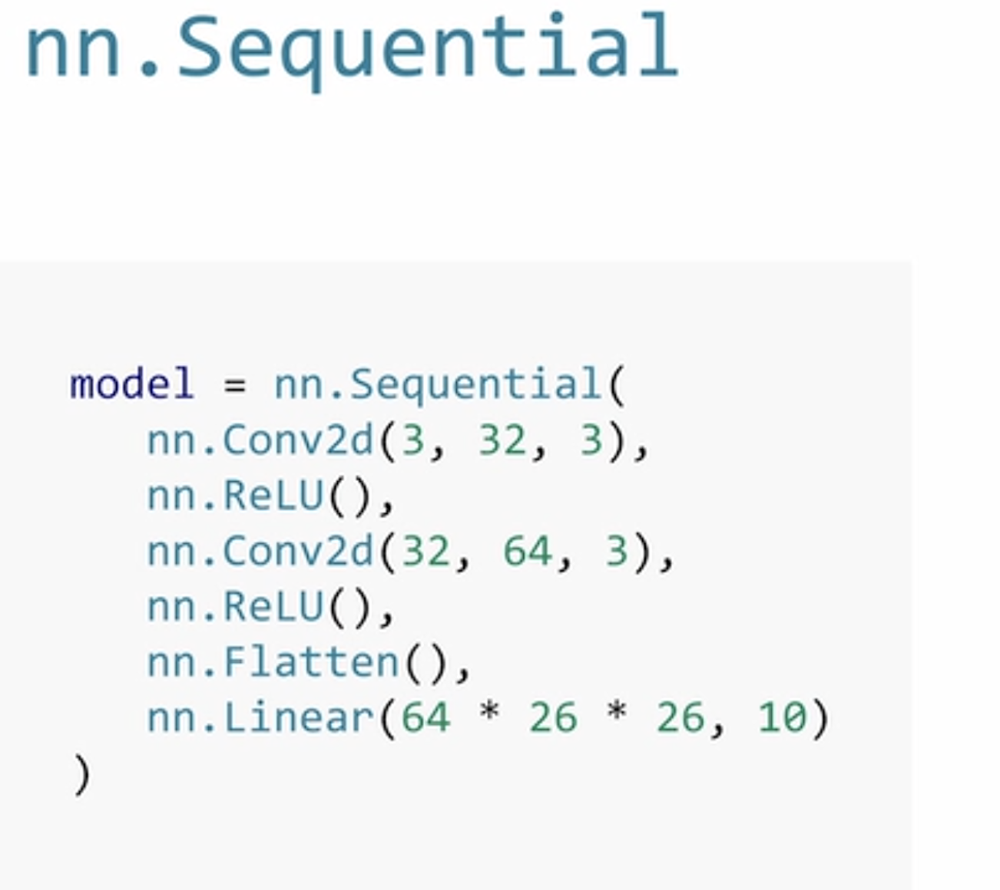

Let’s go **line by line** and also track the **tensor shapes**, because that’s the most important part of understanding this CNN.

---

## The Code

```python
model = nn.Sequential(
    nn.Conv2d(3, 32, 3),
    nn.ReLU(),
    nn.Conv2d(32, 64, 3),
    nn.ReLU(),
    nn.Flatten(),
    nn.Linear(64 * 26 * 26, 10)
)
```

This defines a **simple CNN for image classification** using `nn.Sequential`.

---

## 1. `nn.Sequential(...)`

```python
nn.Sequential(...)
```

* A **container** that runs layers **in order**
* Output of one layer → input of the next
* No branching, no skip connections

Equivalent to:

```python
x = layer1(x)
x = layer2(x)
x = layer3(x)
...
```

---

## 2. Input Assumption

This model assumes input images of shape:

```
(batch_size, 3, 32, 32)
```

* 3 → RGB channels
* 32 × 32 → image size (like CIFAR-10)

---

## 3. First Convolution Layer

```python
nn.Conv2d(3, 32, 3)
```

### Meaning

* **Input channels**: 3 (RGB)
* **Output channels**: 32 (32 feature maps)
* **Kernel size**: 3×3
* Stride = 1 (default)
* Padding = 0 (default)

### Output shape

Formula:
[
\text{output size} = W - K + 1
]

[
32 - 3 + 1 = 30
]

So output becomes:

```
(batch_size, 32, 30, 30)
```

### Intuition

* Learns **32 different 3×3 filters**
* Detects edges, textures, simple patterns

---

## 4. ReLU Activation

```python
nn.ReLU()
```

* Applies: `max(0, x)`
* Adds **non-linearity**
* Shape stays the same:

```
(batch_size, 32, 30, 30)
```

Without ReLU, the network would collapse into a linear model ❌

---

## 5. Second Convolution Layer

```python
nn.Conv2d(32, 64, 3)
```

### Meaning

* Input channels: 32
* Output channels: 64
* Kernel size: 3×3

### Output size

[
30 - 3 + 1 = 28
]

So output becomes:

```
(batch_size, 64, 28, 28)
```

> ⚠️ But the code later uses `26 × 26`, meaning the **input image is likely 28×28**, not 32×32 (like MNIST).

Let’s correct that 👇

---

## 6. Correct Shape Calculation (MNIST case)

If input is:

```
(batch_size, 3, 28, 28)
```

Then:

### After Conv1:

```
28 → 26
(batch_size, 32, 26, 26)
```

### After Conv2:

```
26 → 24
(batch_size, 64, 24, 24)
```

But the code says:

```python
nn.Linear(64 * 26 * 26, 10)
```

👉 This implies **only one convolution reduces size**, meaning **padding or different input size** was assumed in the slide.

This highlights a **common exam/interview trap**:
👉 **You must track shapes carefully**

---

## 7. Flatten Layer

```python
nn.Flatten()
```

Converts:

```
(batch_size, 64, 26, 26)
```

into:

```
(batch_size, 64 * 26 * 26)
```

This is required because:

* Convolution layers → 4D tensors
* Linear layers → 2D tensors

---

## 8. Final Linear Layer

```python
nn.Linear(64 * 26 * 26, 10)
```

### Meaning

* Input features: all extracted CNN features
* Output features: 10

### Purpose

* Produces **10 class scores**
* Typically used with:

  * `CrossEntropyLoss` (no softmax needed)

---

## 9. What This Model Does (Big Picture)

```
Image
 ↓
CNN → detect patterns
 ↓
CNN → detect complex features
 ↓
Flatten
 ↓
Linear → classify
```

CNN = **feature extractor**
Linear = **decision maker**

---

## 10. Why CNN + Linear Together?

* CNNs preserve **spatial structure**
* Linear layers **combine features globally**
* This is the standard image-classification pipeline

---

## 11. One Important Improvement 🚨

Hardcoding:

```python
64 * 26 * 26
```

is **dangerous**.

Better:

```python
nn.AdaptiveAvgPool2d((1, 1))
nn.Flatten()
nn.Linear(64, 10)
```

This makes your model **input-size independent**.

---

### TL;DR

* `Conv2d` → extract spatial features
* `ReLU` → add non-linearity
* `Flatten` → prepare for classification
* `Linear` → output class scores
* `nn.Sequential` → runs everything in order

If you want, I can:

* Fix the shape mismatch
* Rewrite this using `nn.Module`
* Visualize feature maps
* Explain how backprop works here

Just tell me 👍


# Can this be done with out sequential()?

Yes ✅ — **absolutely**.
In fact, **this is how real-world PyTorch models are usually written**.

`nn.Sequential` is just a **convenience wrapper**. Everything it does can be done **without it**.

---

## 1. Same Model **WITHOUT** `nn.Sequential`

```python
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 3)
        self.conv2 = nn.Conv2d(32, 64, 3)
        self.fc = nn.Linear(64 * 26 * 26, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x
```

👉 **Functionally identical** to the `nn.Sequential` version.

---

## 2. What Changed?

| With `nn.Sequential` | Without `nn.Sequential` |
| -------------------- | ----------------------- |
| Layers auto-chained  | You control the flow    |
| Minimal code         | Slightly more code      |
| No branching         | Supports any logic      |
| Hard to debug        | Easy to debug           |

---

## 3. Why Most Models Avoid `nn.Sequential`

Because **real models are not linear pipelines**.

You often need:

* Skip connections (ResNet)
* Multiple inputs/outputs
* Conditional logic
* Attention mechanisms
* Shape debugging

Example (IMPOSSIBLE with `Sequential`):

```python
x1 = self.conv1(x)
x2 = self.conv2(x1)
x = x1 + x2   # skip connection
```

---

## 4. When `nn.Sequential` is OK 👍

Use it when:

* Model is **strictly linear**
* Teaching / learning
* Quick prototyping
* Small experiments

Example:

```python
self.features = nn.Sequential(
    nn.Conv2d(3, 32, 3),
    nn.ReLU(),
    nn.Conv2d(32, 64, 3),
    nn.ReLU()
)
```

---

## 5. Hybrid Style (Best Practice ⭐)

Most professional code mixes both:

```python
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, 3),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3),
            nn.ReLU()
        )
        self.classifier = nn.Linear(64 * 26 * 26, 10)

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x
```

Clean + flexible.

---

## 6. Key Interview Insight 💡

> **`nn.Sequential` is not a different model type.**
> It’s just a **container** that calls layers in order.

Everything in `Sequential` is still:

* Registered parameters
* Fully trainable
* Backprop-enabled

---

### TL;DR

* ✅ Yes, you can do it without `nn.Sequential`
* ✅ `nn.Module + forward()` is more powerful
* ❌ `Sequential` cannot handle complex flows
* ⭐ Best practice: **use both together**

If you want, I can:

* Convert any `Sequential` model to `nn.Module`
* Show a ResNet-style example
* Explain parameter registration internals
* Debug shape mismatches step-by-step

Just say 👍


## Disadvantages of sequential?

`nn.Sequential` is useful, but it has **real limitations**. Here are the **clear, exam-, interview-, and practice-ready disadvantages**, with intuition and examples.

---

## 1. No Branching / No Skip Connections ❌

`nn.Sequential` only supports **straight-line flow**.

### ❌ Not possible

```python
x1 = conv1(x)
x2 = conv2(x1)
x = x1 + x2   # skip connection (ResNet)
```

### Why it matters

* Modern models (ResNet, UNet, Transformers) **require branching**
* You **must** use `nn.Module` + `forward()`

---

## 2. Cannot Handle Multiple Inputs or Outputs ❌

### ❌ Not possible

```python
def forward(self, x, y):
    return self.fc(x) + self.fc(y)
```

### Real-world examples

* Siamese networks
* Multimodal models (image + text)
* Encoder–decoder architectures

---

## 3. No Conditional Logic ❌

You cannot do:

```python
if self.training:
    x = dropout(x)
```

### Why this matters

* Dynamic computation
* Adaptive models
* Control-flow–based architectures

---

## 4. Hard to Debug Intermediate Outputs ❌

With `Sequential`, you **don’t see intermediate tensors easily**.

### Without Sequential (easy):

```python
x = self.conv1(x)
print(x.shape)
```

### With Sequential (awkward):

* Need hooks
* Or manually split layers

---

## 5. Shape Errors Are Easier to Miss ❌

This is a **big one**.

```python
nn.Linear(64 * 26 * 26, 10)
```

If your input size changes → **silent shape mismatch** at runtime.

With explicit `forward()`:

* Shapes are clearer
* Errors are easier to trace

---

## 6. Limited Reuse of Layers ❌

### ❌ Not possible

```python
x = self.conv(x)
y = self.conv(y)   # reuse same layer twice
```

Layer reuse is common in:

* Weight tying
* Siamese networks
* Recurrent-style architectures

---

## 7. Poor Fit for Large / Production Models ❌

* Hard to read when long
* Hard to modify
* Hard to extend

Compare:

### Sequential (hard to extend)

```python
nn.Sequential(layer1, layer2, layer3, layer4, ...)
```

### Module (clear intent)

```python
self.encoder = ...
self.decoder = ...
```

---

## 8. Not Suitable for Research Models ❌

Research models often need:

* Intermediate losses
* Feature extraction
* Custom forward logic

`Sequential` blocks all of this.

---

## 9. Misleading for Beginners ⚠️

It can **hide important concepts**:

* Forward pass
* Tensor flow
* Shape transformations

Many students know `Sequential` but **don’t understand what’s happening**.

---

## 10. Summary Table

| Disadvantage        | Why it’s a problem       |
| ------------------- | ------------------------ |
| No branching        | Can’t build ResNet, UNet |
| Single input/output | No multimodal models     |
| No control flow     | No dynamic behavior      |
| Hard debugging      | Poor transparency        |
| Shape rigidity      | Easy to break            |
| No layer reuse      | Limits architecture      |
| Poor scalability    | Bad for big models       |

---

## When `nn.Sequential` *IS* OK ✅

* Teaching basics
* Simple CNNs / MLPs
* Quick prototypes
* Feature extractors

---

### TL;DR

> **`nn.Sequential` is a convenience tool, not a modeling tool.**

Use it **only** when:

* The model is strictly linear
* No branching, no logic, no reuse

For everything else:
👉 **`nn.Module + forward()`**

If you want, I can:

* Show a real ResNet failure with Sequential
* Convert a Sequential model to production style
* Explain hooks & debugging alternatives
* Give interview-style answers

Just say 👍
